In [110]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import string
import re
import nltk
import gensim
import gensim.corpora as corpora
nltk.download('stopwords')


from PIL import Image
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from gensim.utils import simple_preprocess
from pprint import pprint

%matplotlib notebook

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
db_names = ["word_freq_make", "word_freq_address", "word_freq_all", "word_freq_3d", "word_freq_our", "word_freq_over", 
         "word_freq_remove", "word_freq_internet", "word_freq_order", "word_freq_mail", "word_freq_receive", "word_freq_will", 
         "word_freq_people", "word_freq_report", "word_freq_addresses", "word_freq_free", "word_freq_business", "word_freq_email",
         "word_freq_you", "word_freq_credit", "word_freq_your", "word_freq_font", "word_freq_000", "word_freq_money",
         "word_freq_hp", "word_freq_hpl", "word_freq_george", "word_freq_650", "word_freq_lab", "word_freq_labs",
         "word_freq_telnet", "word_freq_857", "word_freq_data", "word_freq_415", "word_freq_85", "word_freq_technology",
         "word_freq_1999", "word_freq_parts", "word_freq_pm", "word_freq_direct", "word_freq_cs", "word_freq_meeting", 
         "word_freq_original", "word_freq_project", "word_freq_re", "word_freq_edu", "word_freq_table", "word_freq_conference",
         "char_freq_;", "char_freq_(", "char_freq_[", "char_freq_!", "char_freq_$", "char_freq_#", "capital_run_length_average",
         "capital_run_length_longest", "capital_run_length_total", "class"]

In [67]:
df = pd.read_csv("spambase_lab_csv.csv")
df.columns = db_names
df.head()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,...,char_freq_;,char_freq_(,char_freq_[,char_freq_!,char_freq_$,char_freq_#,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
0,0.00,0.64,0.64,0.0,0.32,0.00,0.00,0.00,0.00,0.00,...,0.00,0.000,0.0,0.778,0.000,0.000,3.756,61,278,1
1,0.21,0.28,0.50,0.0,0.14,0.28,0.21,0.07,0.00,0.94,...,0.00,0.132,0.0,0.372,0.180,0.048,5.114,101,1028,1
2,0.06,0.00,0.71,0.0,1.23,0.19,0.19,0.12,0.64,0.25,...,0.01,0.143,0.0,0.276,0.184,0.010,9.821,485,2259,1
3,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,...,0.00,0.137,0.0,0.137,0.000,0.000,3.537,40,191,1
4,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,...,0.00,0.135,0.0,0.135,0.000,0.000,3.537,40,191,1


In [68]:
features = df.iloc[:,0:-1]
labels = df.iloc[:,-1]
features

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,...,word_freq_conference,char_freq_;,char_freq_(,char_freq_[,char_freq_!,char_freq_$,char_freq_#,capital_run_length_average,capital_run_length_longest,capital_run_length_total
0,0.00,0.64,0.64,0.0,0.32,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.000,0.0,0.778,0.000,0.000,3.756,61,278
1,0.21,0.28,0.50,0.0,0.14,0.28,0.21,0.07,0.00,0.94,...,0.0,0.000,0.132,0.0,0.372,0.180,0.048,5.114,101,1028
2,0.06,0.00,0.71,0.0,1.23,0.19,0.19,0.12,0.64,0.25,...,0.0,0.010,0.143,0.0,0.276,0.184,0.010,9.821,485,2259
3,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,...,0.0,0.000,0.137,0.0,0.137,0.000,0.000,3.537,40,191
4,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,...,0.0,0.000,0.135,0.0,0.135,0.000,0.000,3.537,40,191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4596,0.31,0.00,0.62,0.0,0.00,0.31,0.00,0.00,0.00,0.00,...,0.0,0.000,0.232,0.0,0.000,0.000,0.000,1.142,3,88
4597,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.000,0.0,0.353,0.000,0.000,1.555,4,14
4598,0.30,0.00,0.30,0.0,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.102,0.718,0.0,0.000,0.000,0.000,1.404,6,118
4599,0.96,0.00,0.00,0.0,0.32,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.057,0.0,0.000,0.000,0.000,1.147,5,78


In [112]:
df_s = StandardScaler().fit_transform(features)
df_n = preprocessing.normalize(features)
df_n = pd.DataFrame(df_n, columns=features.columns)

# PCA

In [105]:
pca = PCA(n_components=2)

In [130]:
pca.fit(features)

PCA(n_components=2)

In [131]:
proportional_variance = pca.explained_variance_ratio_
pd.DataFrame(np.round(np.append(proportional_variance, np.sum(proportional_variance)), 5), index = ['PC1','PC2', 'Загальна дисперсія'], columns = ['Дисперсія'])

,Дисперсія
PC1,0.92703
PC2,0.07104
Загальна дисперсія,0.99807


In [132]:
df_pca = pd.DataFrame(pca.transform(features), columns = ['PC1','PC2'])
df_pca['class'] = labels

In [133]:
df_pca

,PC1,PC2,class
0,-3.786900,9.411757,1
1,742.632101,-74.001353,1
2,2019.854074,102.077111,1
3,-93.048341,3.008569,1
4,-93.048341,3.008568,1
...,...,...,...
4596,-200.731618,-16.687637,0
4597,-273.563926,-3.547688,0
4598,-170.643810,-18.629712,0
4599,-210.269253,-13.084437,0


<IPython.core.display.Javascript object>


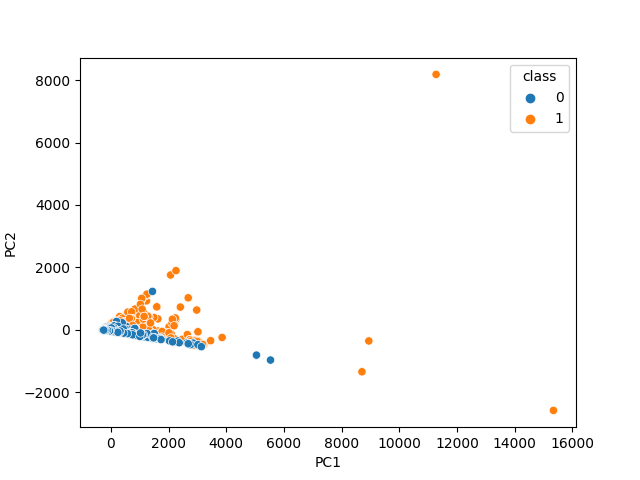

In [139]:
sns.scatterplot(data = df_pca, x = "PC1", y = "PC2", hue = "class")
plt.show()

# TSNE

In [141]:
tsne = TSNE(n_components=2)

In [150]:
df_tsne = tsne.fit_transform(df_s)

In [151]:
df_tsne = pd.DataFrame(df_tsne, columns = ['PC1','PC2'])
df_tsne['class'] = labels

In [152]:
df_tsne

,PC1,PC2,class
0,2.018341,36.153152,1
1,-41.554039,11.903914,1
2,-71.447411,19.954420,1
3,-20.032766,33.088409,1
4,-20.033312,33.088219,1
...,...,...,...
4596,23.603188,-8.951083,0
4597,52.278141,11.377252,0
4598,19.880699,0.094449,0
4599,18.185366,8.679227,0


<IPython.core.display.Javascript object>


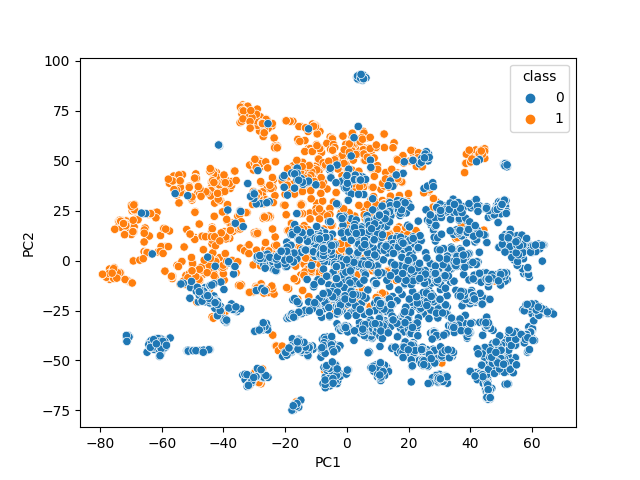

In [154]:
sns.scatterplot(data = df_tsne, x = "PC1", y = "PC2", hue = "class")
plt.show()

# K-mean

Fitting model on a small sub-sample of the data
Predicting color indices on the full image (k-means)


<IPython.core.display.Javascript object>


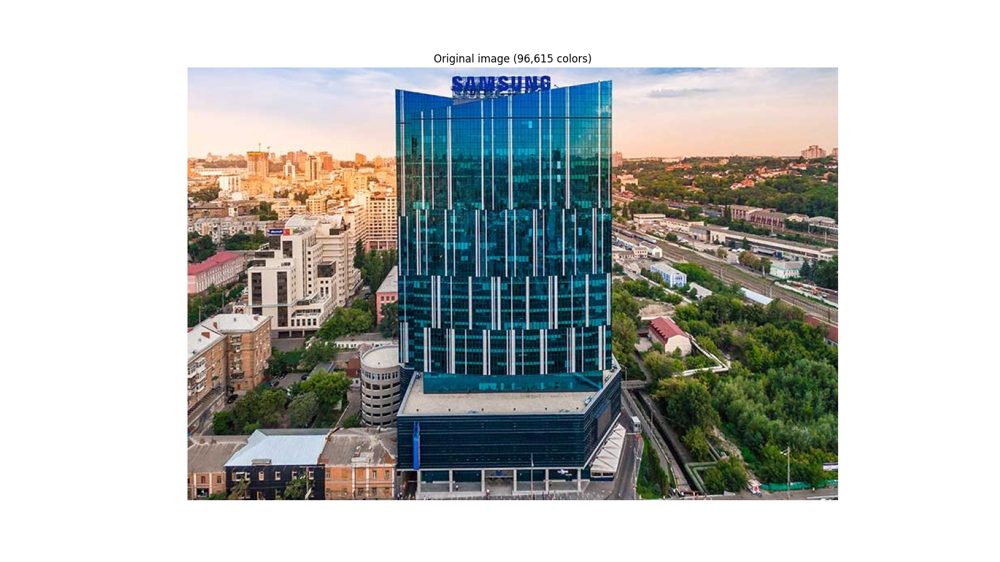

<IPython.core.display.Javascript object>


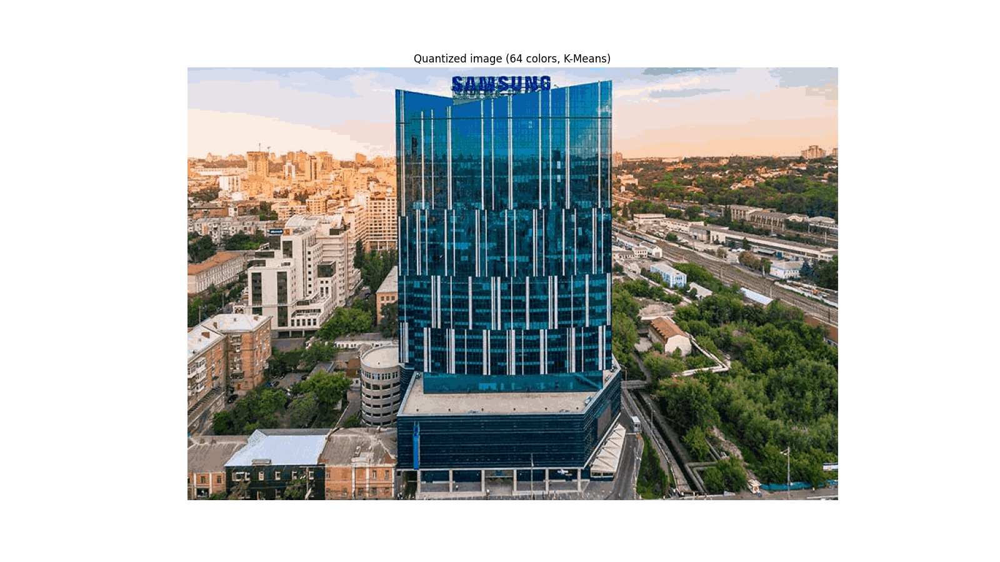

<IPython.core.display.Javascript object>


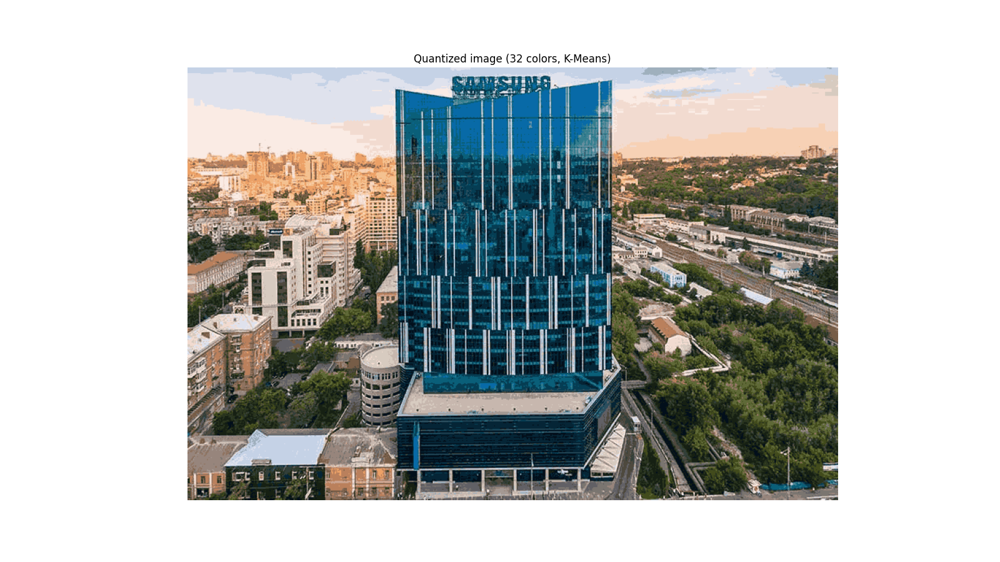

<IPython.core.display.Javascript object>


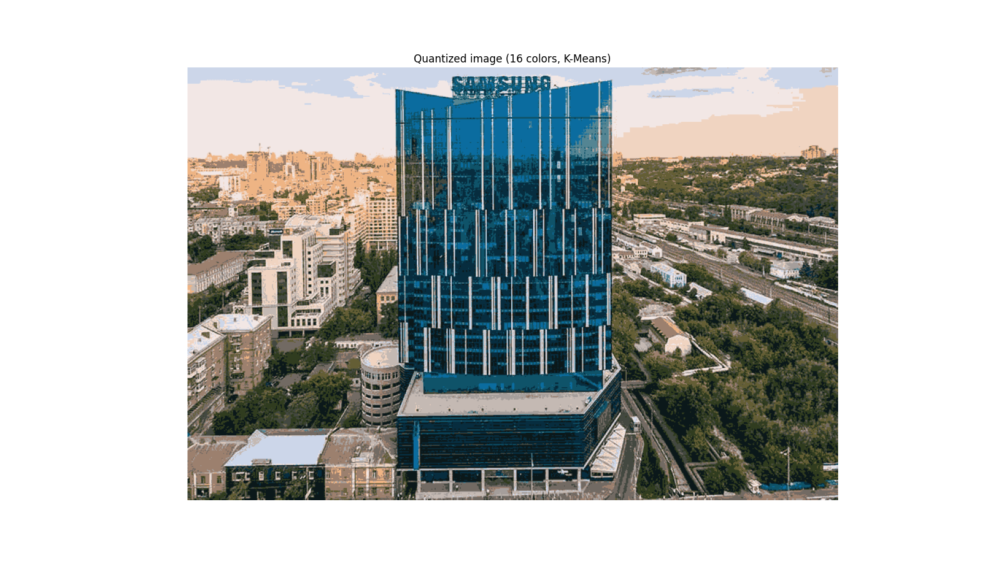

<IPython.core.display.Javascript object>


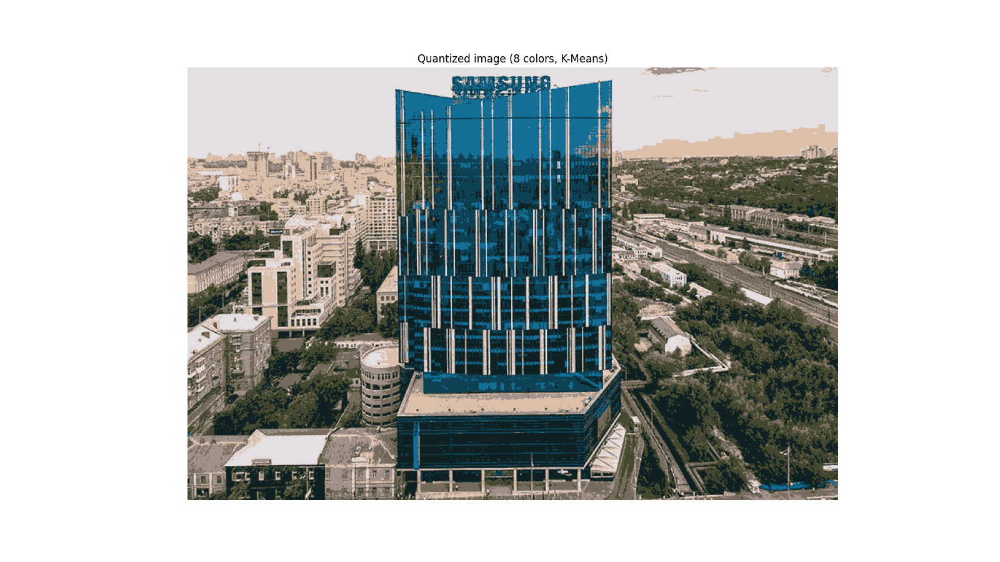

In [302]:
image = Image.open('image.jpg')
image = np.array(image, dtype=np.float64) / 255

w, h, d = original_shape = tuple(image.shape)
image_array = np.reshape(image, (w * h, d))

print("Fitting model on a small sub-sample of the data")
image_array_sample = shuffle(image_array, random_state=0, n_samples=1_000)
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)

print("Predicting color indices on the full image (k-means)")
labels = kmeans.predict(image_array)



def recreate_image(codebook, labels, w, h):
    return codebook[labels].reshape(w, h, -1)


plt.figure(1, figsize=(16, 9))
plt.clf()
plt.axis("off")
plt.title("Original image (96,615 colors)")
plt.imshow(image)

n_colors = 64
plt.figure(2, figsize=(16, 9))
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({n_colors} colors, K-Means)")
plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))


n_colors = 32
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)
labels = kmeans.predict(image_array)

plt.figure(3, figsize=(16, 9))
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({n_colors} colors, K-Means)")
plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))

n_colors = 16
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)
labels = kmeans.predict(image_array)

plt.figure(4, figsize=(16, 9))
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({n_colors} colors, K-Means)")
plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))

n_colors = 8
kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)
labels = kmeans.predict(image_array)

plt.figure(5, figsize=(16, 9))
plt.clf()
plt.axis("off")
plt.title(f"Quantized image ({n_colors} colors, K-Means)")
plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))

# EM алгоритм

In [232]:
np.random.seed(10)
num_points = 1000
mean_1 = [1, 2]
cov_1 = [[1, 0], [0, 1]]
mean_2 = [4, 5]
cov_2 = [[2, 0], [0, 2]]
x_1 = np.random.multivariate_normal(mean_1, cov_1, num_points)
x_2 = np.random.multivariate_normal(mean_2, cov_2, num_points)
df = np.vstack([x_1,x_2])

<IPython.core.display.Javascript object>


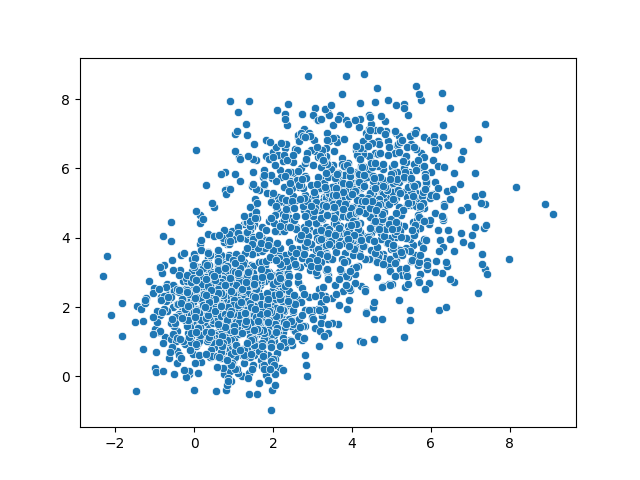

In [234]:
img = sns.scatterplot(x = df[:,0], y = df[:,1])

<IPython.core.display.Javascript object>


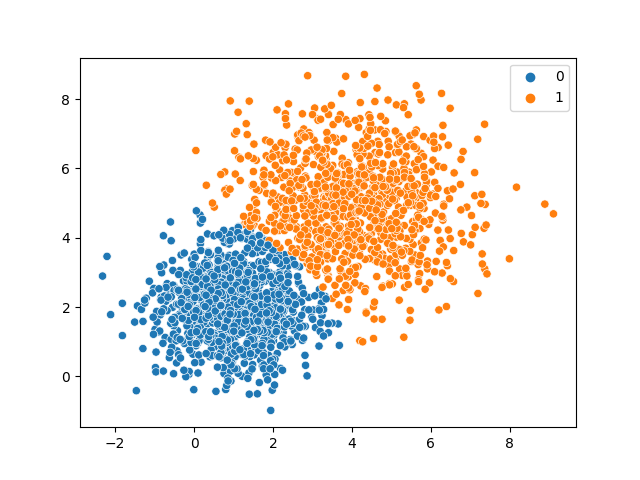

In [247]:
gm = GaussianMixture(n_components=2, random_state=0, covariance_type = 'full')
gm_labels = gm.fit_predict(df)
img = sns.scatterplot(x = df[:,0], y = df[:,1], hue = gm_labels)

In [248]:
cov_1_r = gm.covariances_[0]
cov_2_r = gm.covariances_[1]
mean_1_r = gm.means_[0]
mean_2_r = gm.means_[1]
x_1_r = np.random.multivariate_normal(mean_1_r, cov_1_r, num_points)
x_1_r = np.array(list(zip(x_1_r[:,0], x_1_r[:,1], [0 for i in range(num_points)])))
x_2_r = np.random.multivariate_normal(mean_2_r, cov_2_r, num_points)
x_2_r = np.array(list(zip(x_2_r[:,0], x_2_r[:,1], [1 for i in range(num_points)])))
df_r = np.vstack([x_1_r,x_2_r])
df_r

array([[2.11132386, 1.98174507, 0.        ],
       [1.11535831, 2.24954547, 0.        ],
       [0.65344588, 1.8063491 , 0.        ],
       ...,
       [4.11416104, 7.38854766, 1.        ],
       [2.69452476, 4.33331354, 1.        ],
       [2.71541378, 5.3713186 , 1.        ]])

<IPython.core.display.Javascript object>


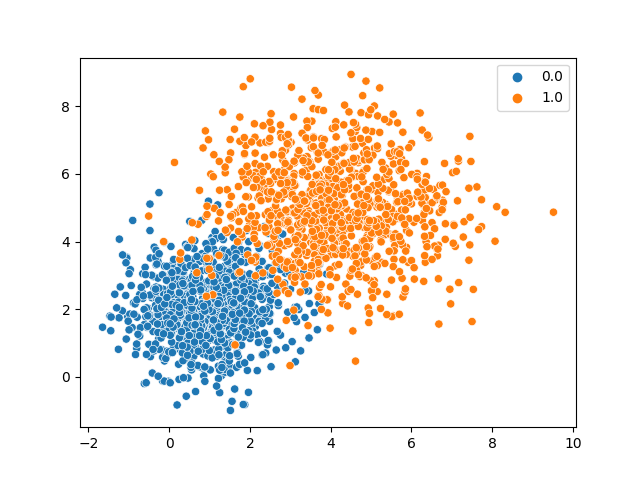

In [250]:
img = sns.scatterplot(x = df_r[:,0], y = df_r[:,1], hue = df_r[:,2])

# Обробка тестових даних

In [3]:
jokes = pd.read_csv('jokes.csv')

In [4]:
jokes.head()

,theme,text,rating
0,pro-sudey,На суде в Стамбуле обвиняемый сказал:\r\n- На...,5
1,pro-sudey,"- Вы продолжаете утверждать, что обвиняемый н...",4
2,pro-sudey,"На суде.\r\n- Итак, когда дело дошло до столкн...",0
3,pro-sudey,Старую леди сбил автомобиль. На суде ее спраши...,4
4,pro-sudey,"Судья говорит:\r\n- Согласно вашей жалобе, об...",2


In [5]:
jokes['text'][10]

'Судья:\r\n- Свидетель, вы женаты?\r\nОбвиняемый:\r\n- Нет, ваша честь, просто я так выгляжу...\r\n\r\n'

In [6]:
jokes['text'] = jokes['text'].str.replace("\n"," ").str.replace("\r"," ")

In [7]:
jokes['text'][10]

'Судья:  - Свидетель, вы женаты?  Обвиняемый:  - Нет, ваша честь, просто я так выгляжу...    '

In [8]:
translator = re.compile('[%s]' % re.escape(string.punctuation))
jokes['text'] = jokes['text'].apply(lambda x: translator.sub(' ', x))

In [9]:
jokes['text'][10]

'Судья     Свидетель  вы женаты   Обвиняемый     Нет  ваша честь  просто я так выгляжу       '

In [10]:
jokes['text'] = jokes['text'].str.lower()

In [11]:
jokes['text'][10]

'судья     свидетель  вы женаты   обвиняемый     нет  ваша честь  просто я так выгляжу       '

In [12]:
stop_words = stopwords.words('russian')
jokes['text'] = jokes['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [13]:
jokes['text'][10]

'судья свидетель женаты обвиняемый ваша честь просто выгляжу'

In [14]:
jokes[jokes['rating'] == 5]['text']

0         суде стамбуле обвиняемый сказал свои жертвы н...
22        судья сообщает подсудимому оправдан это значит...
33        разговаривает вовoчка другом знаешь мои родите...
41        вопрос 5 измеряется напряжение вопрос 4 напряж...
42        студент пришел сдавать экзамен подготовился ду...
                                ...                        
35547     молодой матрос поймал золотую рыбку та проси...
35568     20 лет дракула молодой неопытный поэтому нек...
36500     мужик имел женщин прилетает нему ангел говорит...
36533     лето муравей лаптях рубашке перетянутый реме...
121597    молодые родители хотят сходить кино маленького...
Name: text, Length: 285, dtype: object

<IPython.core.display.Javascript object>


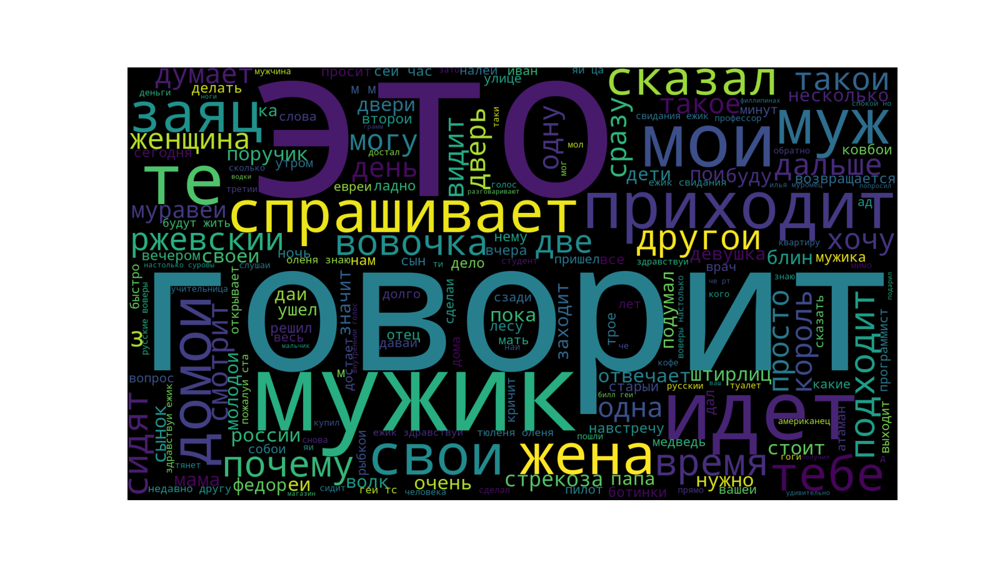

In [397]:
text = " ".join(joke for joke in jokes[jokes['rating'] == 5]['text'])
wordcloud = WordCloud(width = 1920,height = 1080,background_color="black").generate(text)
plt.figure(figsize = (16,9))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

<IPython.core.display.Javascript object>


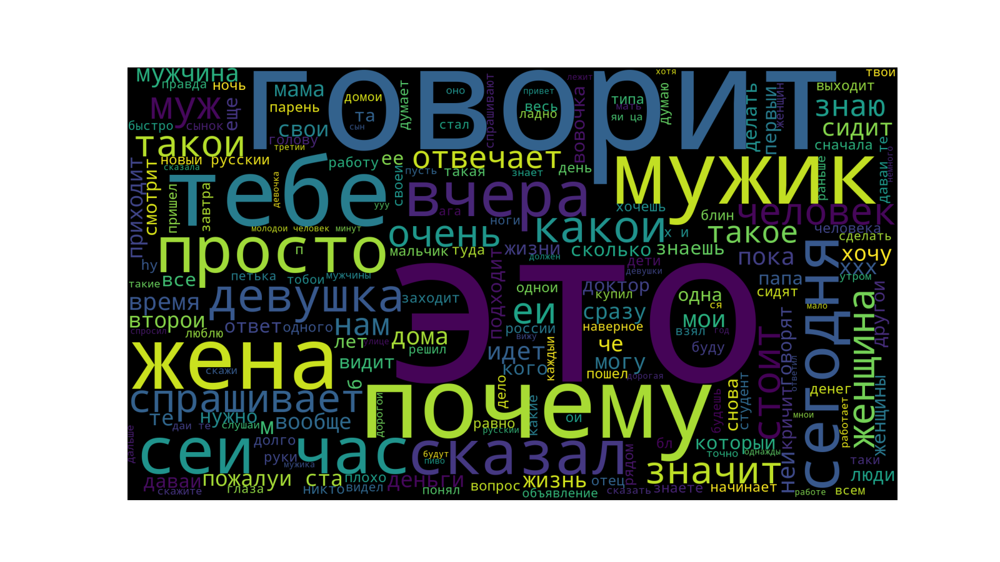

In [398]:
text = " ".join(joke for joke in jokes[jokes['rating'] == 0]['text'])
wordcloud = WordCloud(width = 1920,height = 1080,background_color="black").generate(text)
plt.figure(figsize = (16,9))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [75]:
vectorizer = TfidfVectorizer()
df_1 = jokes[(jokes['rating'] == 0)]['text'][:1000]
df_2 = jokes[(jokes['rating'] == 5)]['text']
df = vectorizer.fit_transform(pd.concat([df_1, df_2]))

In [76]:
df_1

2       суде итак дело дошло столкновения вашего проти...
12      свидетель говорит судья прошу минуту забыть ра...
23      судья побудило ударить жену подсудимый судите...
40      разговор двух студентов медицинского университ...
44      канадская федерация фигурному катанию клюшкой...
                              ...                        
2816    маленький билл баобаба спускался треском сучо...
2817             ученикам курилка пускай курят рюмочной
2818    оперировали спросил врач hу тысячи рублей име...
2819    видел пожилой мужчина грустным лицом сполз ка...
2823    удивляться скорости африканских бегунов джунгл...
Name: text, Length: 1000, dtype: object

In [77]:
labels_1 = jokes[(jokes['rating'] == 0)]['rating'][:1000]
labels_2 = jokes[(jokes['rating'] == 5)]['rating']
labels = pd.concat([labels_1, labels_2])

In [78]:
df

<1285x12773 sparse matrix of type '<class 'numpy.float64'>'
	with 24707 stored elements in Compressed Sparse Row format>

In [79]:
X_train, X_test, y_train, y_test = train_test_split(df, labels, test_size = 0.25, random_state = 0)

In [80]:
print(X_train)

  (0, 11571)	0.39391342118186967
  (0, 2361)	0.39391342118186967
  (0, 4472)	0.39391342118186967
  (0, 12080)	0.39391342118186967
  (0, 6076)	0.357343010700734
  (0, 501)	0.3725211024144254
  (0, 9486)	0.33595069193328975
  (1, 6792)	0.24074295690892558
  (1, 368)	0.24074295690892558
  (1, 7434)	0.24074295690892558
  (1, 5990)	0.24074295690892558
  (1, 4990)	0.24074295690892558
  (1, 10387)	0.24074295690892558
  (1, 4876)	0.24074295690892558
  (1, 12330)	0.24074295690892558
  (1, 5504)	0.24074295690892558
  (1, 923)	0.24074295690892558
  (1, 5714)	0.21839269342161746
  (1, 11857)	0.21839269342161746
  (1, 8671)	0.205318627400305
  (1, 9272)	0.21839269342161746
  (1, 7997)	0.158037154189572
  (1, 9261)	0.21839269342161746
  (1, 1738)	0.1857740122033653
  (1, 2944)	0.18038741767688013
  :	:
  (960, 6232)	0.12651360723784158
  (960, 5500)	0.130578568778276
  (960, 1388)	0.14196771305167574
  (960, 2186)	0.07126658781060236
  (961, 245)	0.29747337003885416
  (961, 352)	0.29747337003885416


In [81]:
SVM = SVC()
SVM.fit(X_train, y_train)
y_pred = SVM.predict(X_test)

print(f'Acuracy: {accuracy_score(y_test,y_pred)*100:.2f}%')
print('Classification Report: \n', classification_report(y_test, y_pred ))
print('Confusion Matrix: \n',confusion_matrix(y_test, y_pred))

Acuracy: 80.12%
Classification Report: 
               precision    recall  f1-score   support

           0       0.79      1.00      0.89       247
           5       1.00      0.15      0.26        75

    accuracy                           0.80       322
   macro avg       0.90      0.57      0.57       322
weighted avg       0.84      0.80      0.74       322

Confusion Matrix: 
 [[247   0]
 [ 64  11]]


In [82]:
RF = RandomForestClassifier()
RF.fit(X_train, y_train)
y_pred = RF.predict(X_test)

print(f'Acuracy: {accuracy_score(y_test,y_pred)*100:.2f}%')
print('Classification Report: \n', classification_report(y_test, y_pred ))
print('Confusion Matrix: \n',confusion_matrix(y_test, y_pred))

Acuracy: 81.06%
Classification Report: 
               precision    recall  f1-score   support

           0       0.80      1.00      0.89       247
           5       1.00      0.19      0.31        75

    accuracy                           0.81       322
   macro avg       0.90      0.59      0.60       322
weighted avg       0.85      0.81      0.76       322

Confusion Matrix: 
 [[247   0]
 [ 61  14]]


In [95]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [111]:
data = jokes[(jokes['rating'] == 0)].text.values.tolist()
data_words = list(sent_to_words(data))

id2word = corpora.Dictionary(data_words)
texts = data_words
corpus = [id2word.doc2bow(text) for text in texts]

lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=5)
pprint(lda_model.print_topics())

[(0,
  '0.016*"это" + 0.006*"говорит" + 0.005*"мужик" + 0.004*"спрашивает" + '
  '0.003*"человек" + 0.003*"девушка" + 0.002*"жена" + 0.002*"время" + '
  '0.002*"такое" + 0.002*"какои"'),
 (1,
  '0.017*"это" + 0.007*"говорит" + 0.004*"почему" + 0.003*"жена" + '
  '0.002*"тебе" + 0.002*"время" + 0.002*"очень" + 0.002*"спрашивает" + '
  '0.002*"папа" + 0.002*"приходит"'),
 (2,
  '0.008*"это" + 0.005*"говорит" + 0.004*"спрашивает" + 0.004*"жена" + '
  '0.004*"тебе" + 0.003*"почему" + 0.003*"муж" + 0.002*"мужик" + 0.002*"стоит" '
  '+ 0.002*"подходит"'),
 (3,
  '0.005*"это" + 0.003*"говорит" + 0.003*"доктор" + 0.003*"мужик" + '
  '0.003*"спрашивает" + 0.002*"почему" + 0.002*"девушка" + 0.002*"просто" + '
  '0.002*"сеичас" + 0.002*"тебе"'),
 (4,
  '0.006*"это" + 0.006*"говорит" + 0.005*"мужик" + 0.004*"тебе" + 0.003*"жена" '
  '+ 0.003*"муж" + 0.003*"спрашивает" + 0.003*"мама" + 0.003*"лет" + '
  '0.003*"почему"')]


In [112]:
data = jokes[(jokes['rating'] == 5)].text.values.tolist()
data_words = list(sent_to_words(data))

id2word = corpora.Dictionary(data_words)
texts = data_words
corpus = [id2word.doc2bow(text) for text in texts]

lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=5)
pprint(lda_model.print_topics())

[(0,
  '0.011*"это" + 0.004*"мужик" + 0.004*"вовочка" + 0.004*"говорит" + '
  '0.003*"ржевскии" + 0.003*"подходит" + 0.002*"буду" + 0.002*"такои" + '
  '0.002*"жена" + 0.002*"подумал"'),
 (1,
  '0.006*"это" + 0.005*"идет" + 0.005*"говорит" + 0.003*"муж" + '
  '0.003*"здравствуи" + 0.003*"измеряется" + 0.003*"напряжение" + 0.003*"заяц" '
  '+ 0.003*"вопрос" + 0.003*"другои"'),
 (2,
  '0.014*"мужик" + 0.010*"говорит" + 0.004*"тебе" + 0.004*"это" + 0.003*"хочу" '
  '+ 0.003*"идет" + 0.003*"тюленя" + 0.003*"внутри" + 0.003*"знаю" + '
  '0.002*"снаружи"'),
 (3,
  '0.008*"это" + 0.005*"говорит" + 0.004*"штирлиц" + 0.004*"другу" + '
  '0.003*"мои" + 0.003*"сынок" + 0.003*"недавно" + 0.003*"очень" + '
  '0.003*"свои" + 0.002*"дальше"'),
 (4,
  '0.005*"говорит" + 0.005*"это" + 0.004*"идет" + 0.003*"почему" + '
  '0.003*"жить" + 0.003*"будут" + 0.003*"мужик" + 0.003*"мои" + 0.003*"ежик" + '
  '0.003*"вчера"')]
